In [ ]:
LEVEL-1 TASK-1  Data Exploration and Preprocessing

In [17]:
import pandas as pd

file_path = "D:\Dataset.csv"
dataset = pd.read_csv(file_path)

rows, columns = dataset.shape

print(f'The dataset has {rows} rows and {columns} columns.')

The dataset has 9551 rows and 21 columns.


In [18]:
missing_values = dataset.isnull().sum()
print("Missing values in each column before handling:\n", missing_values)

# Fill missing values
dataset['Cuisines'].fillna('Unknown', inplace=True)

Missing values in each column before handling:
 Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


In [19]:
# Save the updated dataset
updated_file_path = "D:\Dataset.csv"
dataset.to_csv(updated_file_path, index=False)

In [20]:
# Check for missing values again 
missing_values_after = dataset.isnull().sum()
print("\nMissing values in each column after handling:\n", missing_values_after)

data_info = dataset.info()


Missing values in each column after handling:
 Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
file_path = "D:\Dataset.csv"
data = pd.read_csv(file_path)

print("Data types before conversion:\n", data.dtypes)

Data types before conversion:
 Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
dtype: object


In [22]:
data['Votes'] = data['Votes'].astype(int)
data['Aggregate rating'] = data['Aggregate rating'].astype(float)

print("\nData types after conversion:\n", data.dtypes)


Data types after conversion:
 Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int32
dtype: object


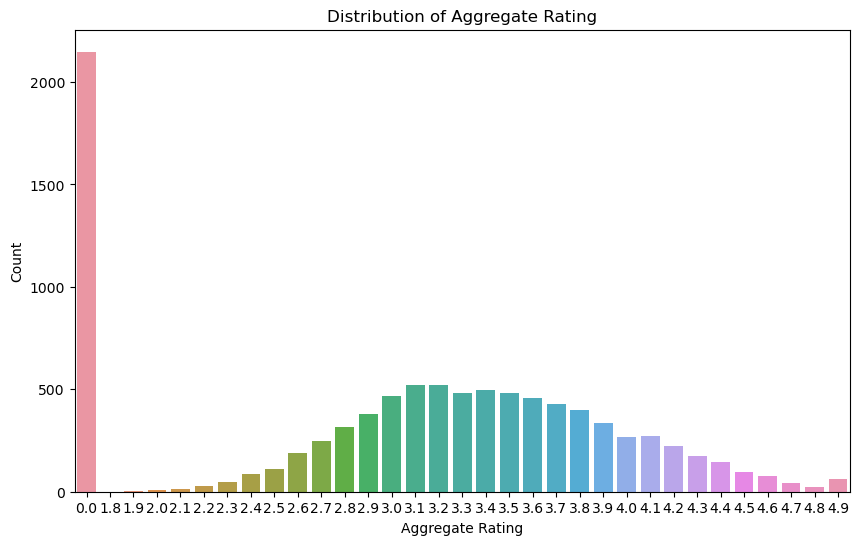

In [23]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Aggregate rating', data=data)
plt.title('Distribution of Aggregate Rating')
plt.xlabel('Aggregate Rating')
plt.ylabel('Count')
plt.show()

In [24]:
rating_distribution = data['Aggregate rating'].value_counts().sort_index()
print("\nAggregate Rating Distribution:\n", rating_distribution)


Aggregate Rating Distribution:
 Aggregate rating
0.0    2148
1.8       1
1.9       2
2.0       7
2.1      15
2.2      27
2.3      47
2.4      87
2.5     110
2.6     191
2.7     250
2.8     315
2.9     381
3.0     468
3.1     519
3.2     522
3.3     483
3.4     498
3.5     480
3.6     458
3.7     427
3.8     400
3.9     335
4.0     266
4.1     274
4.2     221
4.3     174
4.4     144
4.5      95
4.6      78
4.7      42
4.8      25
4.9      61
Name: count, dtype: int64


In [ ]:
LEVEL-1 TASK-2 Descriptive Analysis

In [1]:
#Calculate basic statistical measures
import pandas as pd

file_path = "D:\Dataset.csv"
data = pd.read_csv(file_path)

numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns
columns_to_exclude = ['Restaurant ID', 'Country Code', 'Longitude', 'Latitude']

relevant_columns = [col for col in numerical_columns if col not in columns_to_exclude]
print("\nNumerical columns in the dataset:\n", relevant_columns)


Numerical columns in the dataset:
 ['Average Cost for two', 'Price range', 'Aggregate rating', 'Votes']


In [2]:
# Calculate basic statistical measures for numerical columns
statistics = {}
for col in relevant_columns:
    mean = data[col].mean()
    median = data[col].median()
    std_dev = data[col].std()
    variance = data[col].var()
    statistics[col] = {
        'mean': mean,
        'median': median,
        'std_dev': std_dev,
        'variance': variance
    }
print("\nBasic Statistical Measures:")
for col, stats in statistics.items():
    print(f"\nColumn: {col}")
    print(f"Mean: {stats['mean']}")
    print(f"Median: {stats['median']}")
    print(f"Standard Deviation: {stats['std_dev']}")
    print(f"Variance: {stats['variance']}")


Basic Statistical Measures:

Column: Average Cost for two
Mean: 1199.2107632708617
Median: 400.0
Standard Deviation: 16121.18307349965
Variance: 259892543.6892916

Column: Price range
Mean: 1.804837189823055
Median: 2.0
Standard Deviation: 0.9056088473975366
Variance: 0.8201273844846946

Column: Aggregate rating
Mean: 2.66637001361114
Median: 3.2
Standard Deviation: 1.5163775396521686
Variance: 2.2994008427615644

Column: Votes
Mean: 156.909747670401
Median: 31.0
Standard Deviation: 430.1691453762977
Variance: 185045.49363377434



No missing values found for Country Code

No missing values found for City

No missing values found for Cuisines


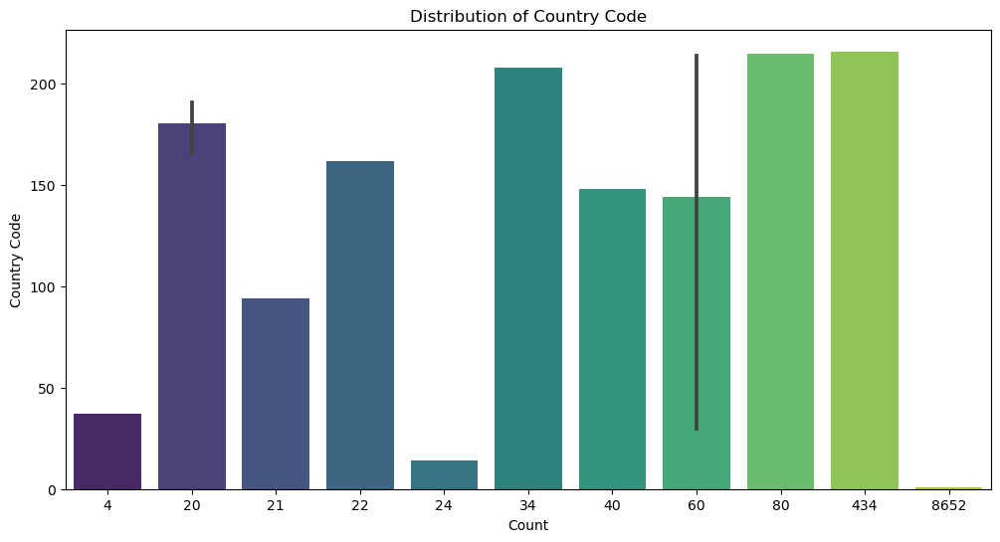

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
def plot_categorical_distribution(column_name, data, top_n=20):
    plt.figure(figsize=(12, 6))
    value_counts = data[column_name].value_counts().head(top_n)
    sns.barplot(x=value_counts.values, y=value_counts.index, palette='viridis')
    plt.title(f'Distribution of {column_name}')
    plt.xlabel('Count')
    plt.ylabel(column_name)
    plt.show()

def handle_missing_values(column_name, data):
    if data[column_name].isnull().sum() > 0:
        print(f"\nHandling missing values for {column_name}...")
        data[column_name].fillna('Unknown', inplace=True)
    else:
        print(f"\nNo missing values found for {column_name}")

columns_to_check = ['Country Code', 'City', 'Cuisines']
for col in columns_to_check:
    handle_missing_values(col, data)
plot_categorical_distribution("Country Code", data)

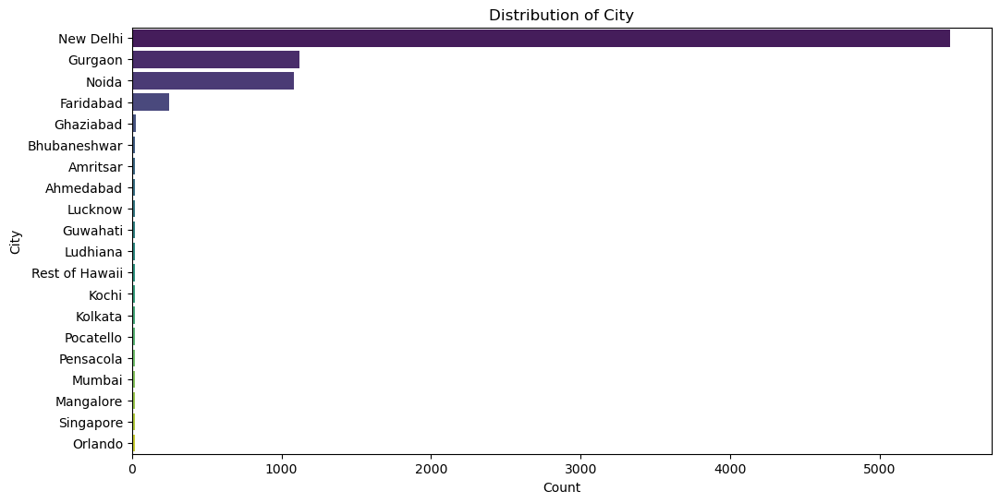

In [4]:
plot_categorical_distribution("City", data)

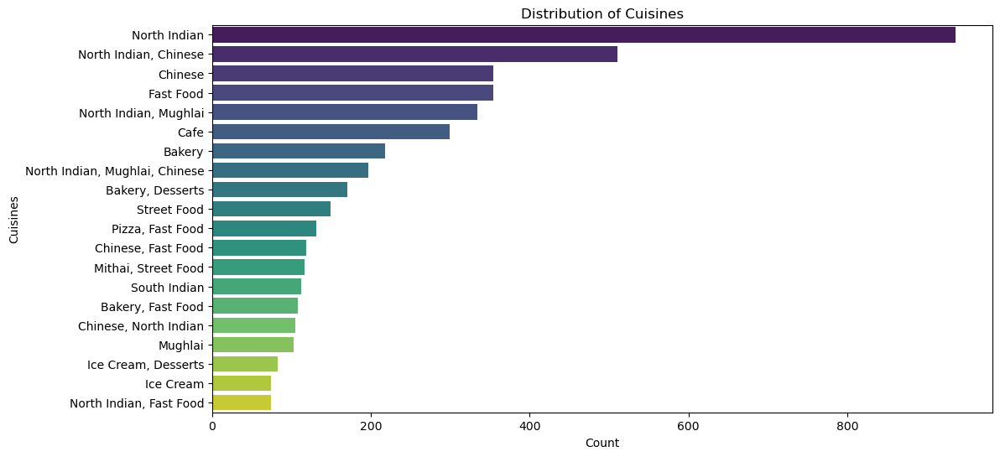

In [5]:
plot_categorical_distribution("Cuisines", data)

In [6]:
data['City'].fillna('Unknown', inplace=True)
data['Cuisines'].fillna('Unknown', inplace=True)

top_cuisines = data['Cuisines'].value_counts().head(10)
print("\nTop 10 Cuisines with the highest number of restaurants:")
print(top_cuisines)

top_cities = data['City'].value_counts().head(10)
print("\nTop 10 Cities with the highest number of restaurants:")
print(top_cities)


Top 10 Cuisines with the highest number of restaurants:
Cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64

Top 10 Cities with the highest number of restaurants:
City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Amritsar          21
Ahmedabad         21
Lucknow           21
Guwahati          21
Name: count, dtype: int64


In [ ]:
LEVEL-1 TASK-3 Geospatial Analysis

In [1]:
#Visualize the locations of restaurants on a map 
import pandas as pd
import folium
from folium.plugins import MarkerCluster


file_path = "D:\Dataset.csv"
data = pd.read_csv(file_path)

data.dropna(subset=['Latitude', 'Longitude'], inplace=True)
restaurant_map = folium.Map(location=[0, 0], zoom_start=2)

marker_cluster = MarkerCluster().add_to(restaurant_map)
for _, row in data.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['Restaurant Name']}<br>{row['City']}",
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(marker_cluster)

restaurant_map.fit_bounds(marker_cluster.get_bounds())
restaurant_map.save("D:\map.html")
restaurant_map

In [11]:
# Analysing the distribution of restaurants across different cities and countries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = "D:\Dataset.csv"
data = pd.read_csv(file_path)
country_code_to_name = {
    1: "India",
    14: "Australia",
    30: "Brazil",
    37: "Canada",
    94: "Indonesia",
    148: "New Zealand",
    162: "Philippines",
    166: "Qatar",
    184: "Singapore",
    189: "South Africa",
    191: "Sri Lanka",
    208: "Turkey",
    214: "UAE",
    215: "United Kingdom",
    216: "United States"
}
data['Country'] = data['Country Code'].map(country_code_to_name)
data.dropna(subset=['Country'], inplace=True)
country_distribution = data['Country'].value_counts()

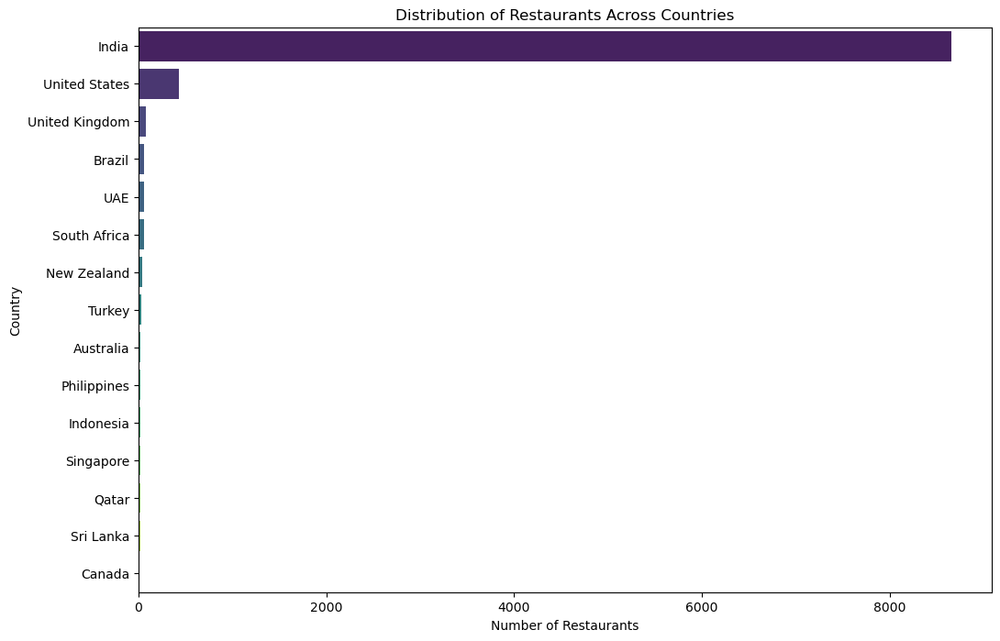

In [12]:
# Plot the distribution of restaurants across countries
plt.figure(figsize=(12, 8))
sns.barplot(x=country_distribution.values, y=country_distribution.index, palette='viridis')
plt.title('Distribution of Restaurants Across Countries')
plt.xlabel('Number of Restaurants')
plt.ylabel('Country')
plt.show()

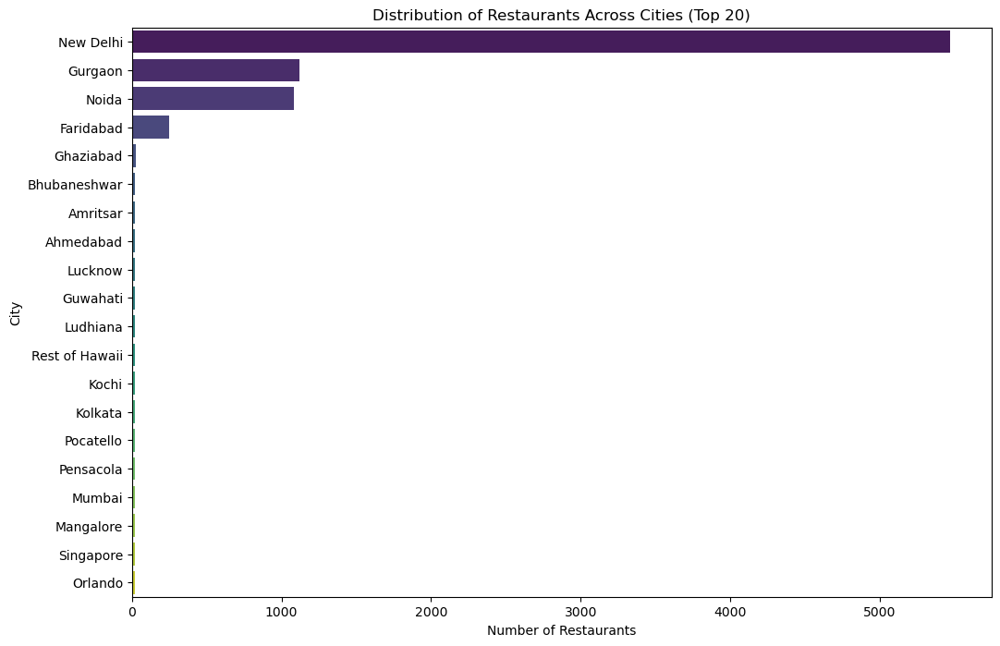

In [13]:
# Plot the distribution of restaurants across cities
city_distribution = data['City'].value_counts().head(20) 
plt.figure(figsize=(12, 8))
sns.barplot(x=city_distribution.values, y=city_distribution.index, palette='viridis')
plt.title('Distribution of Restaurants Across Cities (Top 20)')
plt.xlabel('Number of Restaurants')
plt.ylabel('City')
plt.show()

Correlation Matrix:
                  Latitude  Longitude  Aggregate rating
Latitude          1.000000   0.043207          0.000516
Longitude         0.043207   1.000000         -0.116818
Aggregate rating  0.000516  -0.116818          1.000000


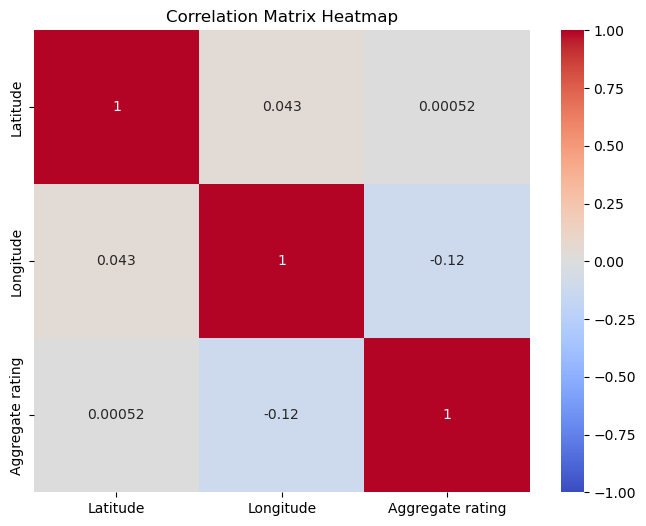

In [14]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
data.dropna(subset=['Latitude', 'Longitude', 'Aggregate rating'], inplace=True)
correlation_matrix = data[['Latitude', 'Longitude', 'Aggregate rating']].corr()
print("Correlation Matrix:")
print(correlation_matrix)

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix Heatmap')
plt.show()

Text(0, 0.5, 'Aggregate Rating')

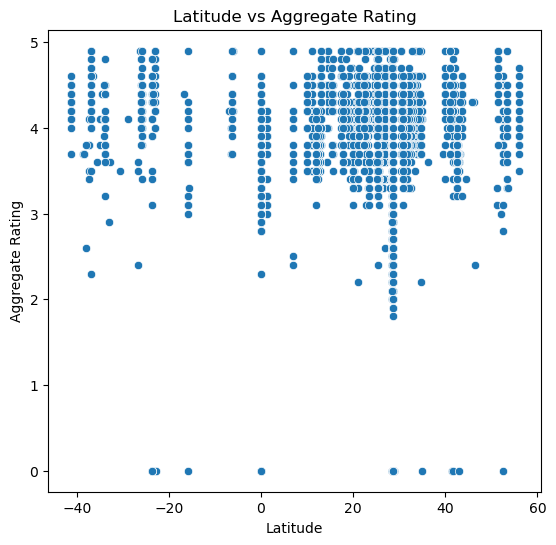

In [17]:
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
sns.scatterplot(x='Latitude', y='Aggregate rating', data=data)
plt.title('Latitude vs Aggregate Rating')
plt.xlabel('Latitude')
plt.ylabel('Aggregate Rating')

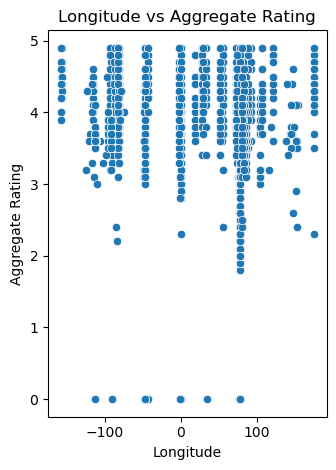

In [16]:
plt.subplot(1, 2, 2)
sns.scatterplot(x='Longitude', y='Aggregate rating', data=data)
plt.title('Longitude vs Aggregate Rating')
plt.xlabel('Longitude')
plt.ylabel('Aggregate Rating')

plt.tight_layout()
plt.show()